In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
voice_df = pd.read_csv('vocal_gender_features_new.csv')

In [3]:
print(voice_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16148 entries, 0 to 16147
Data columns (total 44 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean_spectral_centroid   16148 non-null  float64
 1   std_spectral_centroid    16148 non-null  float64
 2   mean_spectral_bandwidth  16148 non-null  float64
 3   std_spectral_bandwidth   16148 non-null  float64
 4   mean_spectral_contrast   16148 non-null  float64
 5   mean_spectral_flatness   16148 non-null  float64
 6   mean_spectral_rolloff    16148 non-null  float64
 7   zero_crossing_rate       16148 non-null  float64
 8   rms_energy               16148 non-null  float64
 9   mean_pitch               16148 non-null  float64
 10  min_pitch                16148 non-null  float64
 11  max_pitch                16148 non-null  float64
 12  std_pitch                16148 non-null  float64
 13  spectral_skew            16148 non-null  float64
 14  spectral_kurtosis     

In [4]:
print(voice_df.isnull().sum())

mean_spectral_centroid     0
std_spectral_centroid      0
mean_spectral_bandwidth    0
std_spectral_bandwidth     0
mean_spectral_contrast     0
mean_spectral_flatness     0
mean_spectral_rolloff      0
zero_crossing_rate         0
rms_energy                 0
mean_pitch                 0
min_pitch                  0
max_pitch                  0
std_pitch                  0
spectral_skew              0
spectral_kurtosis          0
energy_entropy             0
log_energy                 0
mfcc_1_mean                0
mfcc_1_std                 0
mfcc_2_mean                0
mfcc_2_std                 0
mfcc_3_mean                0
mfcc_3_std                 0
mfcc_4_mean                0
mfcc_4_std                 0
mfcc_5_mean                0
mfcc_5_std                 0
mfcc_6_mean                0
mfcc_6_std                 0
mfcc_7_mean                0
mfcc_7_std                 0
mfcc_8_mean                0
mfcc_8_std                 0
mfcc_9_mean                0
mfcc_9_std    

In [5]:
print(voice_df.duplicated().sum())

1078


In [6]:
voice_df = voice_df.drop_duplicates(keep='first').reset_index(drop=True)

In [7]:
print(voice_df.duplicated().sum())

0


In [8]:
voice_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15070 entries, 0 to 15069
Data columns (total 44 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean_spectral_centroid   15070 non-null  float64
 1   std_spectral_centroid    15070 non-null  float64
 2   mean_spectral_bandwidth  15070 non-null  float64
 3   std_spectral_bandwidth   15070 non-null  float64
 4   mean_spectral_contrast   15070 non-null  float64
 5   mean_spectral_flatness   15070 non-null  float64
 6   mean_spectral_rolloff    15070 non-null  float64
 7   zero_crossing_rate       15070 non-null  float64
 8   rms_energy               15070 non-null  float64
 9   mean_pitch               15070 non-null  float64
 10  min_pitch                15070 non-null  float64
 11  max_pitch                15070 non-null  float64
 12  std_pitch                15070 non-null  float64
 13  spectral_skew            15070 non-null  float64
 14  spectral_kurtosis     

In [9]:
voice_df.describe()

,mean_spectral_centroid,std_spectral_centroid,mean_spectral_bandwidth,std_spectral_bandwidth,mean_spectral_contrast,mean_spectral_flatness,mean_spectral_rolloff,zero_crossing_rate,rms_energy,mean_pitch,...,mfcc_9_std,mfcc_10_mean,mfcc_10_std,mfcc_11_mean,mfcc_11_std,mfcc_12_mean,mfcc_12_std,mfcc_13_mean,mfcc_13_std,label
count,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,...,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000,15070.000000
mean,1701.384153,1018.110186,1584.749875,428.708065,20.350168,0.022640,3268.907144,0.116748,0.084099,1452.435740,...,13.579835,-0.354899,12.493800,-8.759508,11.031914,0.752369,9.716857,-6.490542,9.545742,0.653019
std,317.899605,285.942121,128.309386,75.195519,1.659254,0.009914,532.560286,0.037657,0.022540,289.350721,...,2.477078,5.660750,2.335347,5.378700,1.906687,4.308970,1.820020,4.070429,1.572650,0.476025
min,719.559285,194.998983,1106.939002,199.321584,15.154801,0.001816,1310.661765,0.027727,0.022425,359.391170,...,5.826506,-20.188465,5.459179,-26.082537,5.594748,-13.585977,4.378153,-26.402317,4.686154,0.000000
25%,1462.411426,817.940317,1502.170289,378.987364,19.696228,0.015253,2890.701572,0.088303,0.067177,1268.347100,...,11.875185,-4.379518,10.753674,-12.522636,9.673325,-2.179148,8.422898,-9.454068,8.443469,0.000000
50%,1692.912130,1040.257378,1584.254283,421.364247,20.734723,0.021228,3279.389303,0.115117,0.082656,1473.799850,...,13.348467,-0.365365,12.273242,-8.492837,10.854513,0.846666,9.588833,-6.230590,9.447487,1.000000
75%,1914.255553,1225.857413,1667.967754,472.578414,21.504851,0.028573,3627.881779,0.142590,0.099309,1655.827250,...,15.123625,3.394877,14.062226,-5.022693,12.222374,3.741092,10.886566,-3.378730,10.519854,1.000000
max,3059.390150,1912.173446,2046.070801,724.361505,24.907725,0.072172,5451.099537,0.270710,0.187577,2454.724000,...,26.693924,19.610289,22.717190,6.013963,19.685654,16.436730,17.380630,6.187790,17.941544,1.000000


In [10]:
cols = list(voice_df.columns)

In [11]:
sns.set_theme(context='talk',style='darkgrid',palette='deep')

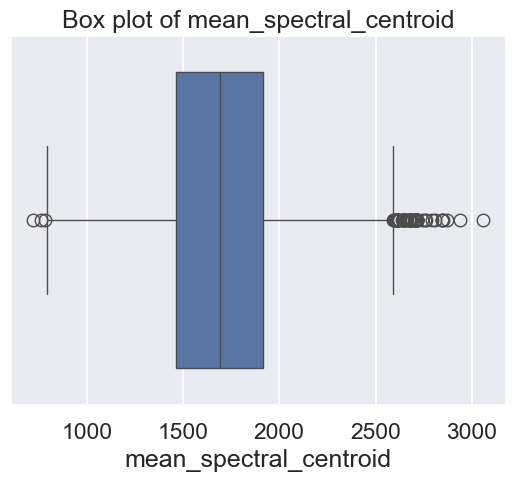

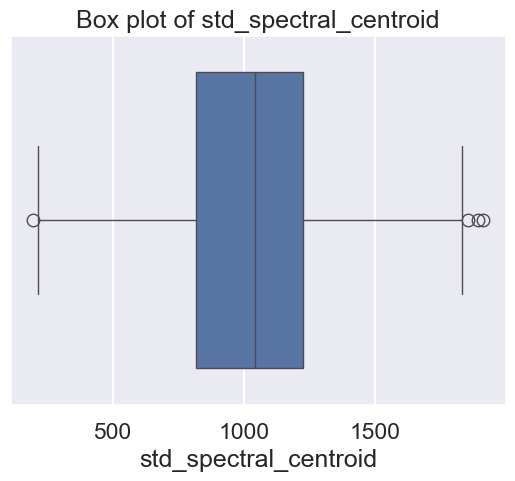

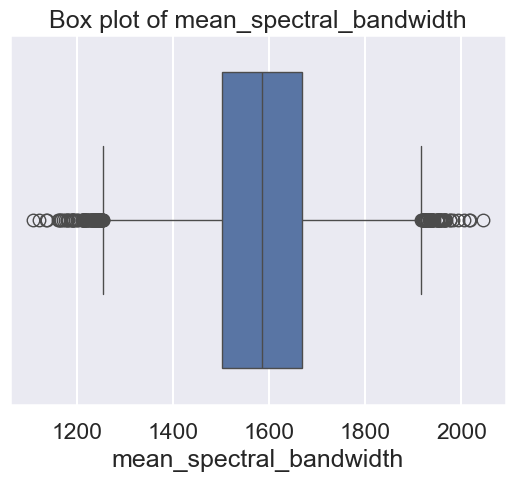

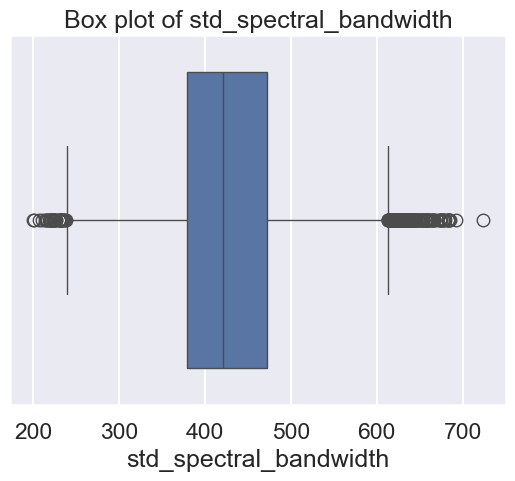

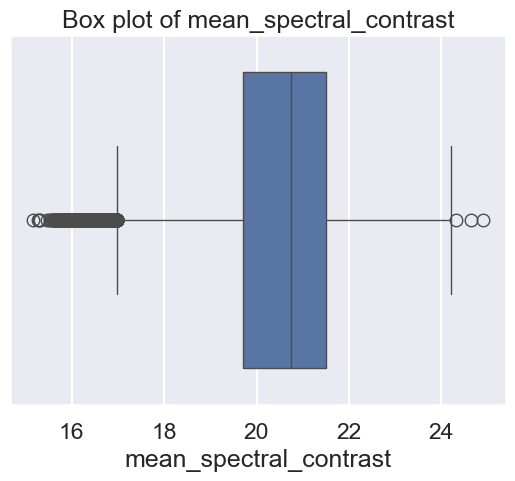

...

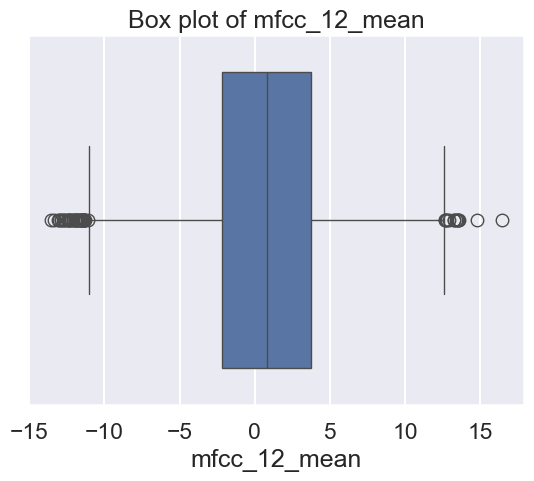

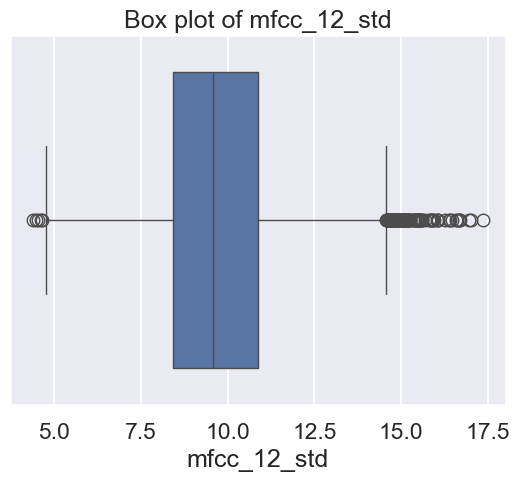

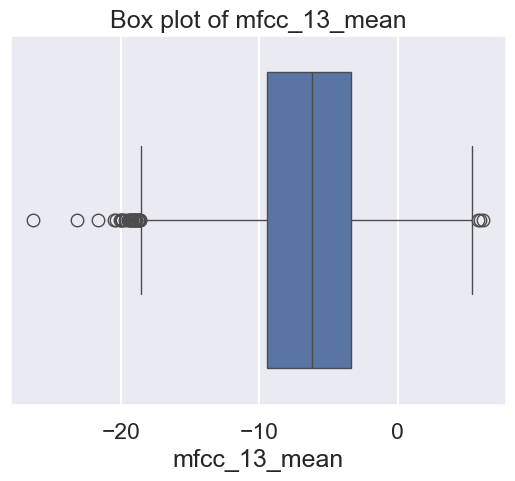

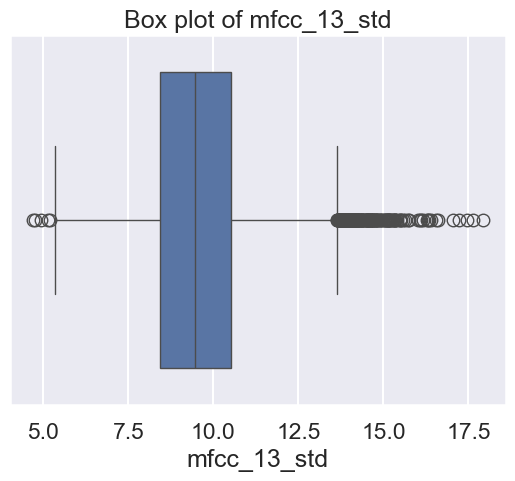

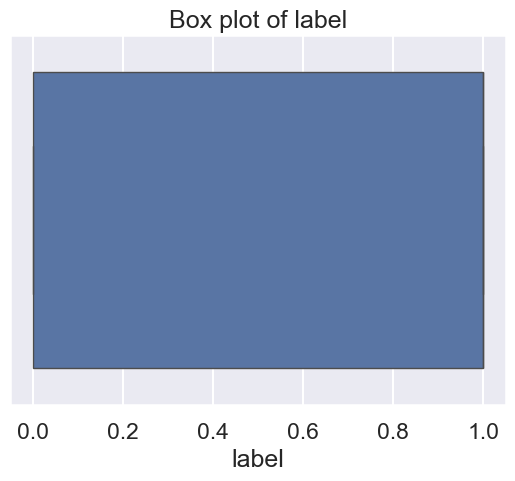

In [12]:
for col in cols:
    if voice_df[col].dtype.name != 'object':
        sns.boxplot(voice_df,x=col)
        plt.title(f'Box plot of {col}')
        plt.show()

In [13]:
def outliers(df,col):
    q1 = np.percentile(df[col],25)
    q3 = np.percentile(df[col],75)
    iqr = q3-q1
    l1 = q1-(iqr*1.5)
    l2 = q3+(iqr*1.5)
    outs = df[(df[col]<l1)|(df[col]>l2)]
    out_perc = (len(outs)/len(df))*100
    return out_perc,l1,l2
    

In [14]:
for col in cols:
    perc,lower_limit,upper_limit = outliers(voice_df,col)
    print(f'Outlier percent in {col}:{perc}')

Outlier percent in mean_spectral_centroid:0.384870603848706
Outlier percent in std_spectral_centroid:0.026542800265428
Outlier percent in mean_spectral_bandwidth:0.9754479097544791
Outlier percent in std_spectral_bandwidth:1.6589250165892502
Outlier percent in mean_spectral_contrast:6.310550763105508
Outlier percent in mean_spectral_flatness:1.3802256138022562
Outlier percent in mean_spectral_rolloff:0.3981420039814201
Outlier percent in zero_crossing_rate:0.4114134041141341
Outlier percent in rms_energy:0.35169210351692104
Outlier percent in mean_pitch:0.8560053085600532
Outlier percent in min_pitch:5.182481751824818
Outlier percent in max_pitch:10.524220305242203
Outlier percent in std_pitch:4.147312541473125
Outlier percent in spectral_skew:1.778367617783676
Outlier percent in spectral_kurtosis:3.722627737226277
Outlier percent in energy_entropy:1.0550763105507632
Outlier percent in log_energy:0.9356337093563372
Outlier percent in mfcc_1_mean:1.864631718646317
Outlier percent in mfc

In [15]:
for col in cols:
    perc,lower_limit,upper_limit = outliers(voice_df,col)
    if perc<5:
        voice_df = voice_df[(voice_df[col]>lower_limit)&(voice_df[col]<upper_limit)]

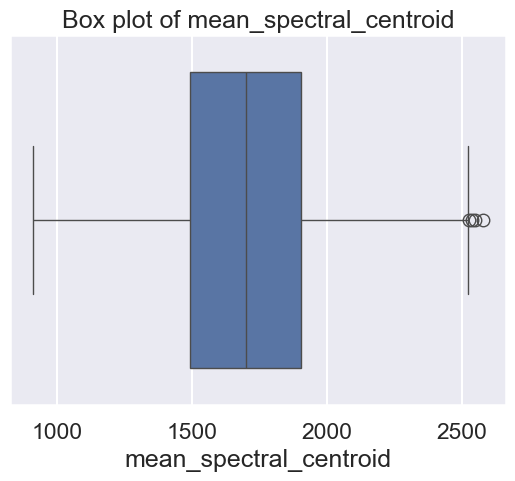

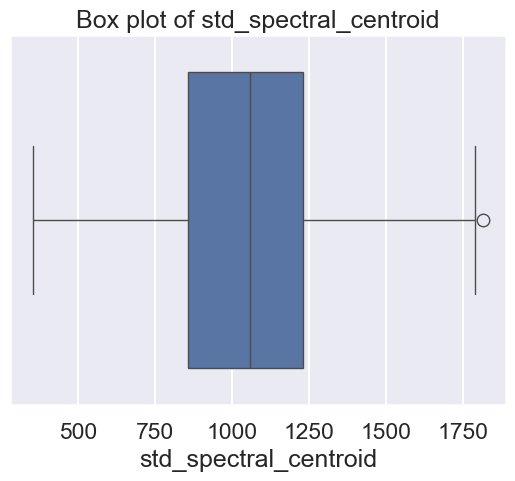

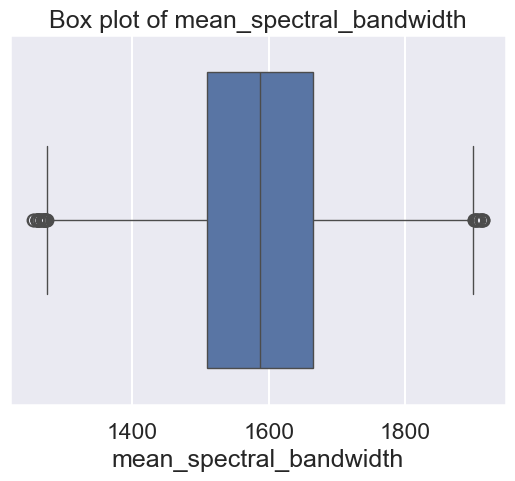

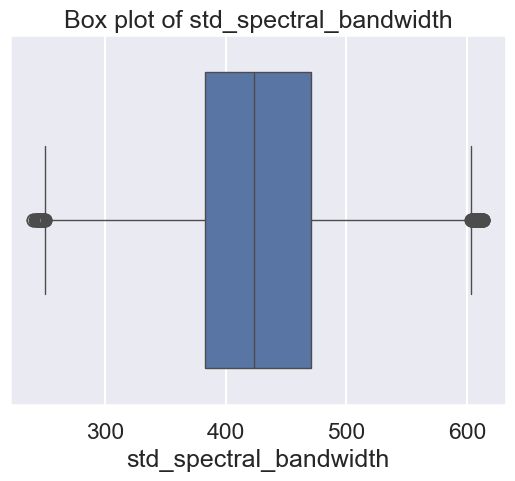

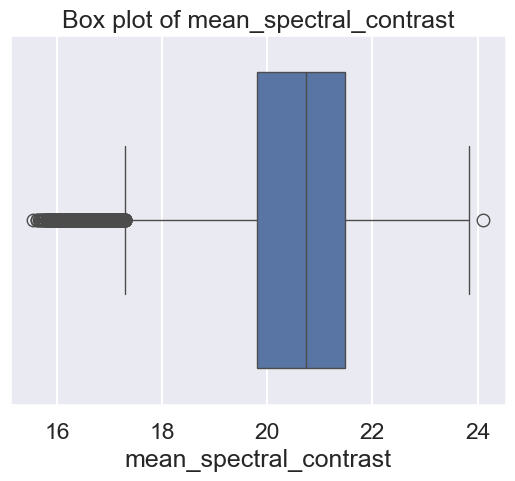

...

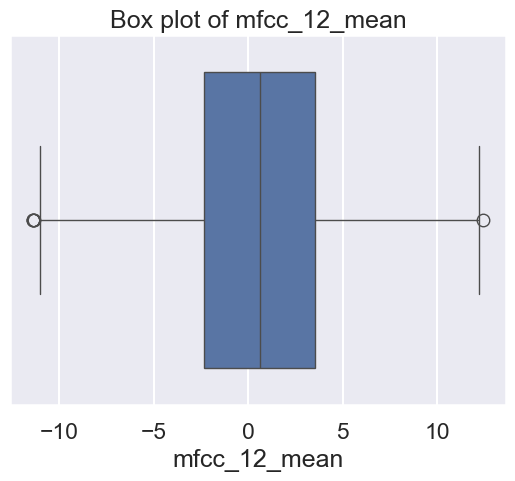

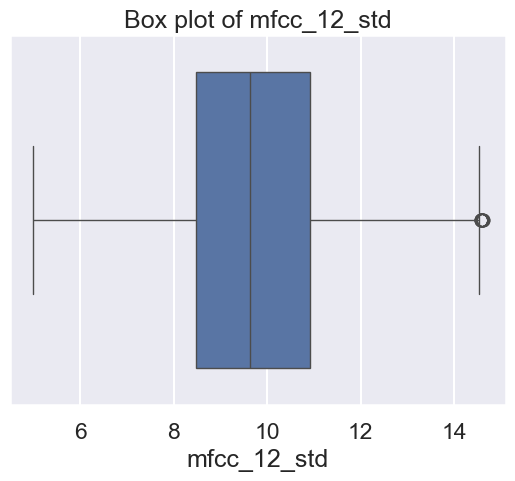

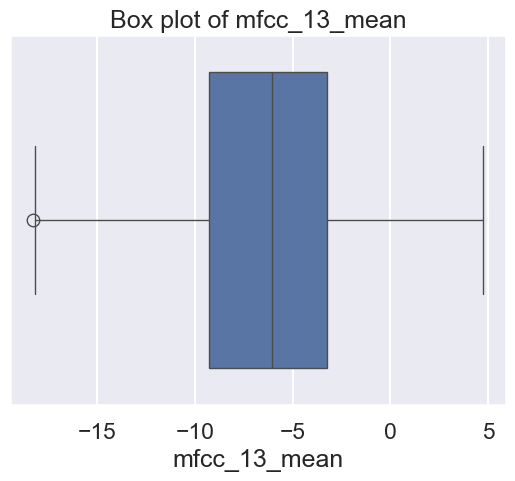

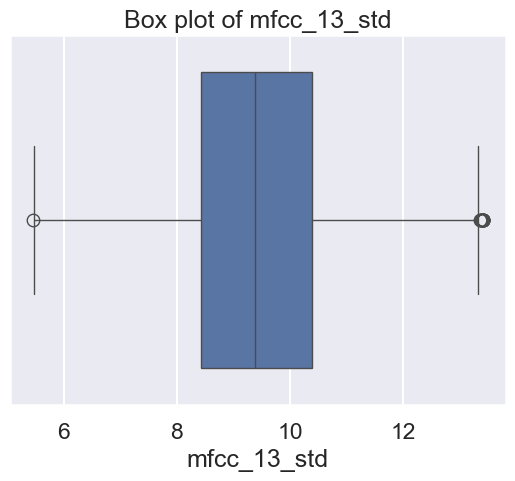

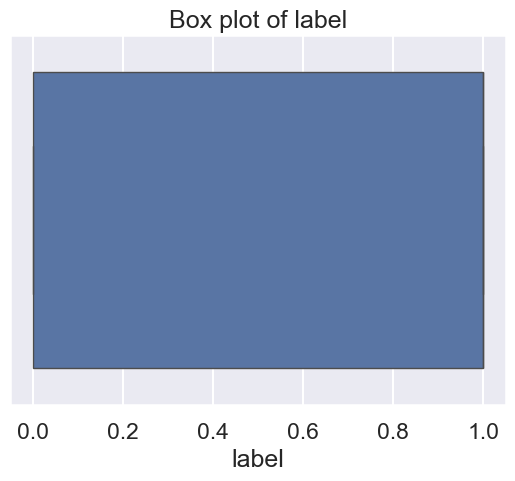

In [16]:
for col in cols:
    if voice_df[col].dtype.name != 'object':
        sns.boxplot(voice_df,x=col)
        plt.title(f'Box plot of {col}')
        plt.show()

In [17]:
num_cols = cols.copy()
num_cols.remove('label')

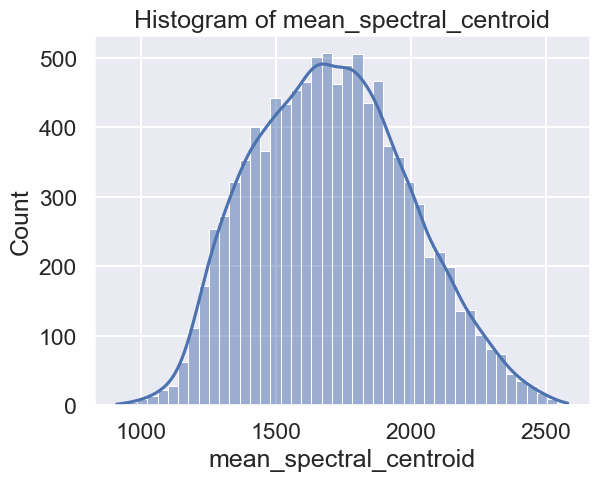

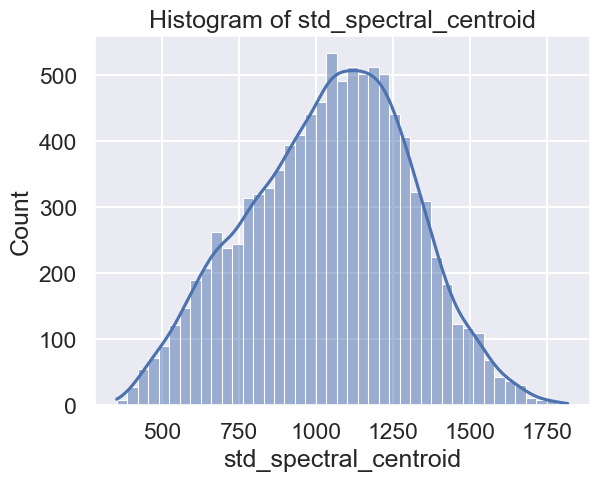

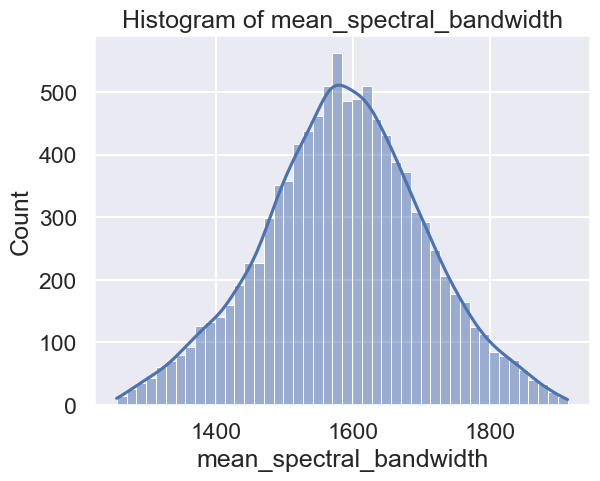

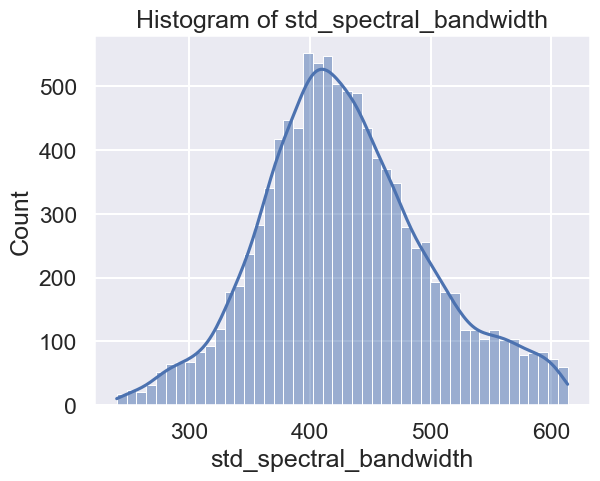

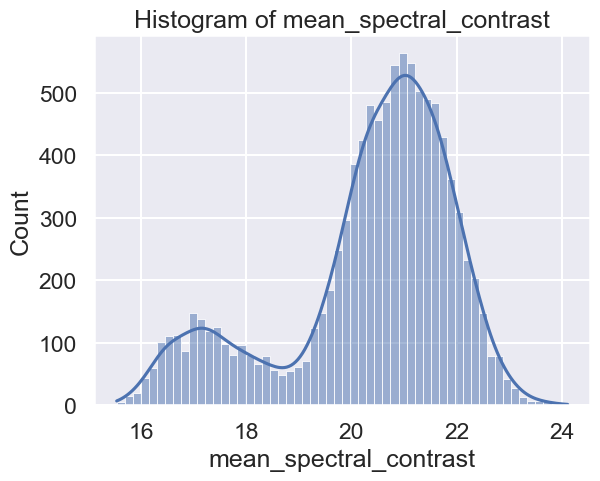

...

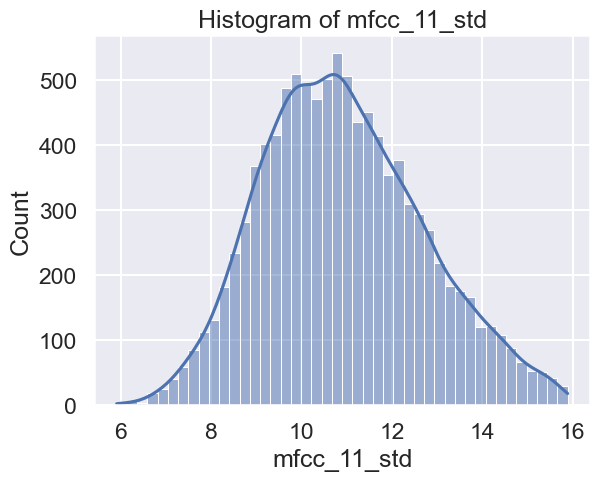

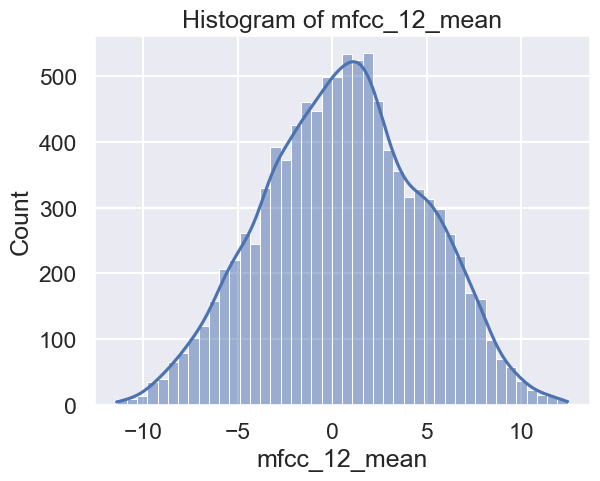

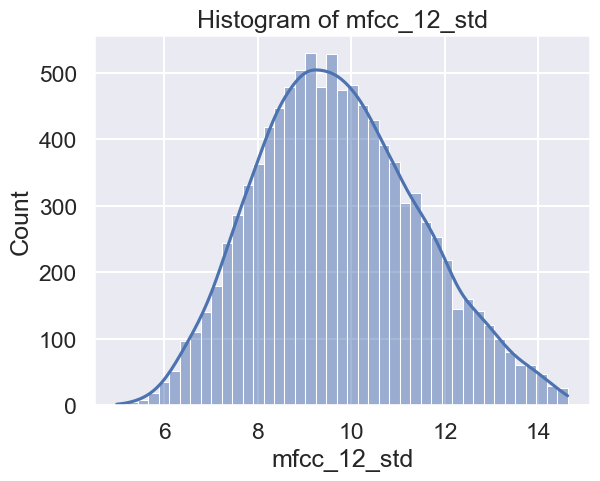

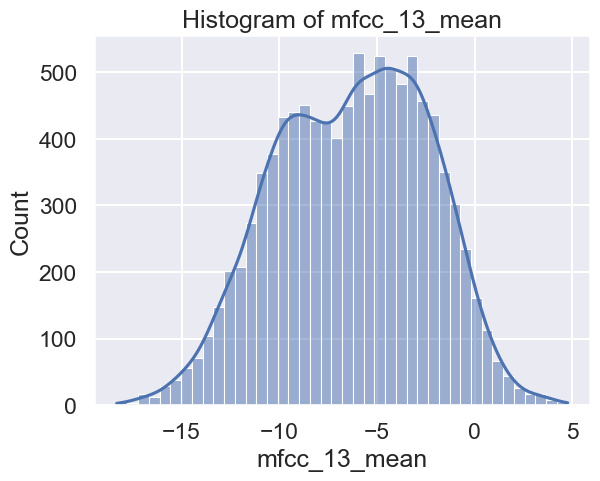

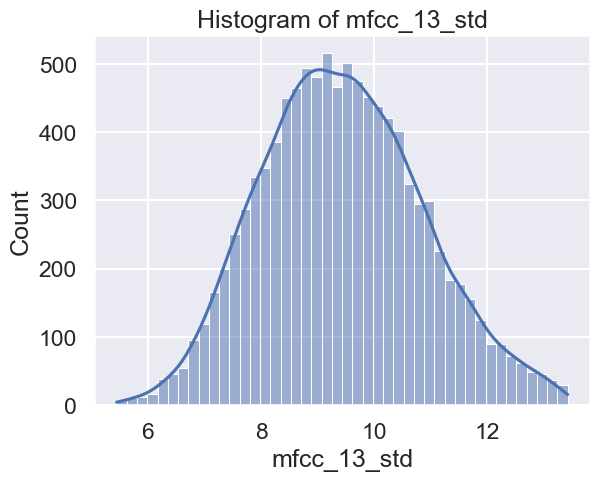

In [18]:
for col in num_cols:
    sns.histplot(voice_df,x = col,kde=True)
    plt.title(f'Histogram of {col}')
    plt.show()

In [19]:
pitch_cols = []
spectral_cols=[]
energy_cols=[]
mfcc_cols = []
other_cols = []
for col in cols:
    if 'pitch' in col:
        pitch_cols.append(col)
    elif 'spectral' in col:
        spectral_cols.append(col)
    elif 'energy' in col:
        energy_cols.append(col)
    elif 'mfcc' in col:
        mfcc_cols.append(col)
    else:
        other_cols.append(col)


Text(0.5, 1.0, 'Correlation heatmap(Pitch)')

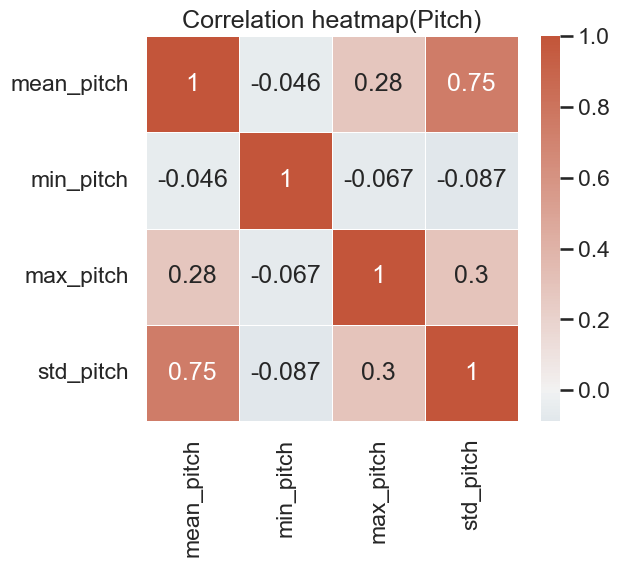

In [20]:
pitch_corr = voice_df[pitch_cols].corr()
fig,ax = plt.subplots(figsize=(6,5))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(pitch_corr,cmap=cmap,linewidths=0.5,linecolor='white',center=0,annot=True)
plt.title('Correlation heatmap(Pitch)')

In [21]:
def remove_highcorr(df,corr_df,tolerance_p=0.85,tolerance_n=-0.85):
    high_corr = []
    for index,row in corr_df.iterrows():
        for index,value in row.items():
            if value>tolerance_p and value<1.0:
                if index not in high_corr:
                    high_corr.append(index)
            elif value<tolerance_n:
                if index not in high_corr:
                    high_corr.append(index)
    df_x = df.drop(columns=high_corr,axis=1)
    return df_x

In [22]:
# pitch_df = remove_highcorr(voice_df,pitch_corr)

Text(0.5, 1.0, 'Correlation heatmap(spectral)')

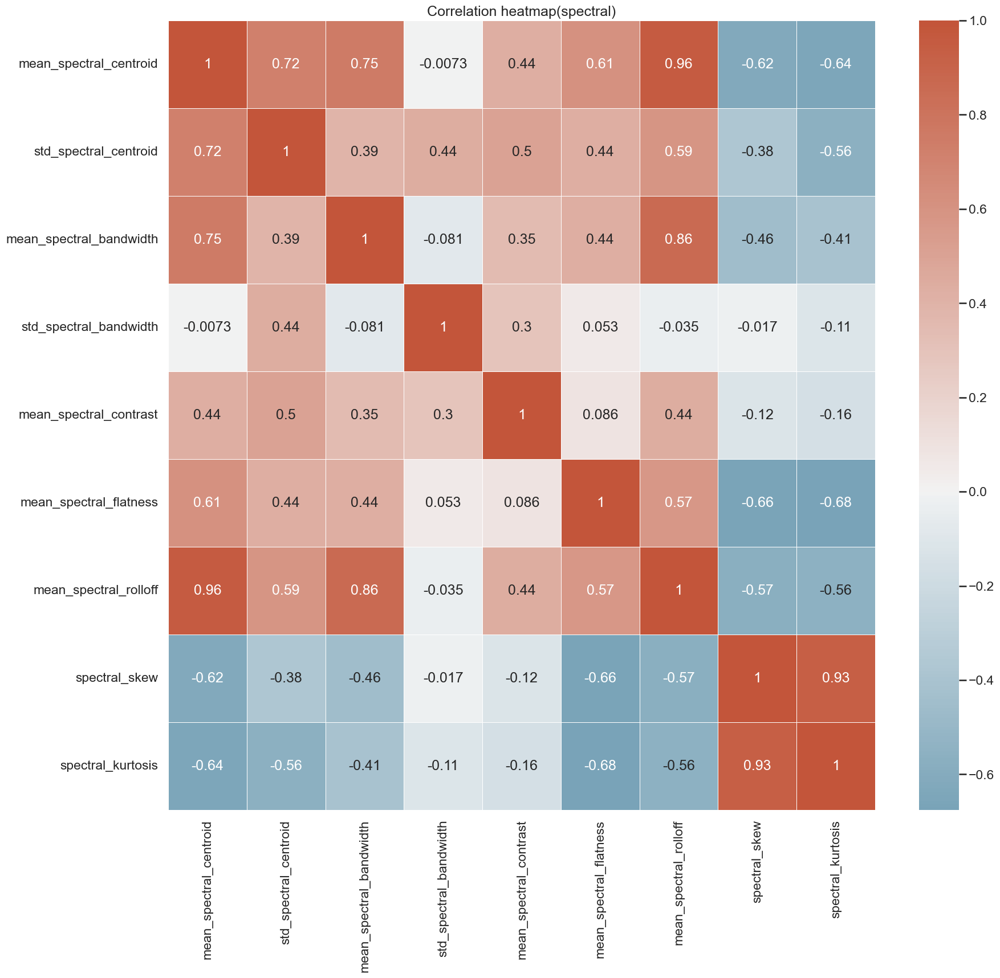

In [23]:
spectral_corr = voice_df[spectral_cols].corr()
fig,ax = plt.subplots(figsize=(20,18))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(spectral_corr,cmap=cmap,linewidths=0.5,linecolor='white',center=0,annot=True)
plt.title('Correlation heatmap(spectral)')

In [24]:
# spectral_df = remove_highcorr(voice_df,spectral_corr)

Text(0.5, 1.0, 'Correlation heatmap(energy)')

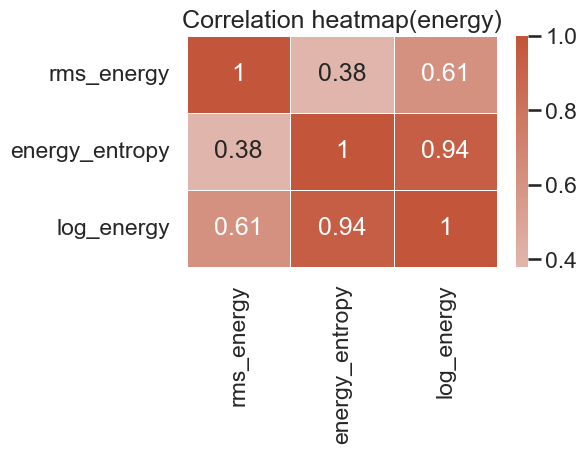

In [25]:
energy_corr = voice_df[energy_cols].corr()
fig,ax = plt.subplots(figsize=(5,3))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(energy_corr,cmap=cmap,linewidths=0.5,linecolor='white',center=0,annot=True)
plt.title('Correlation heatmap(energy)')

In [26]:
# energy_df = remove_highcorr(voice_df,energy_corr)

Text(0.5, 1.0, 'Correlation heatmap(mfcc)')

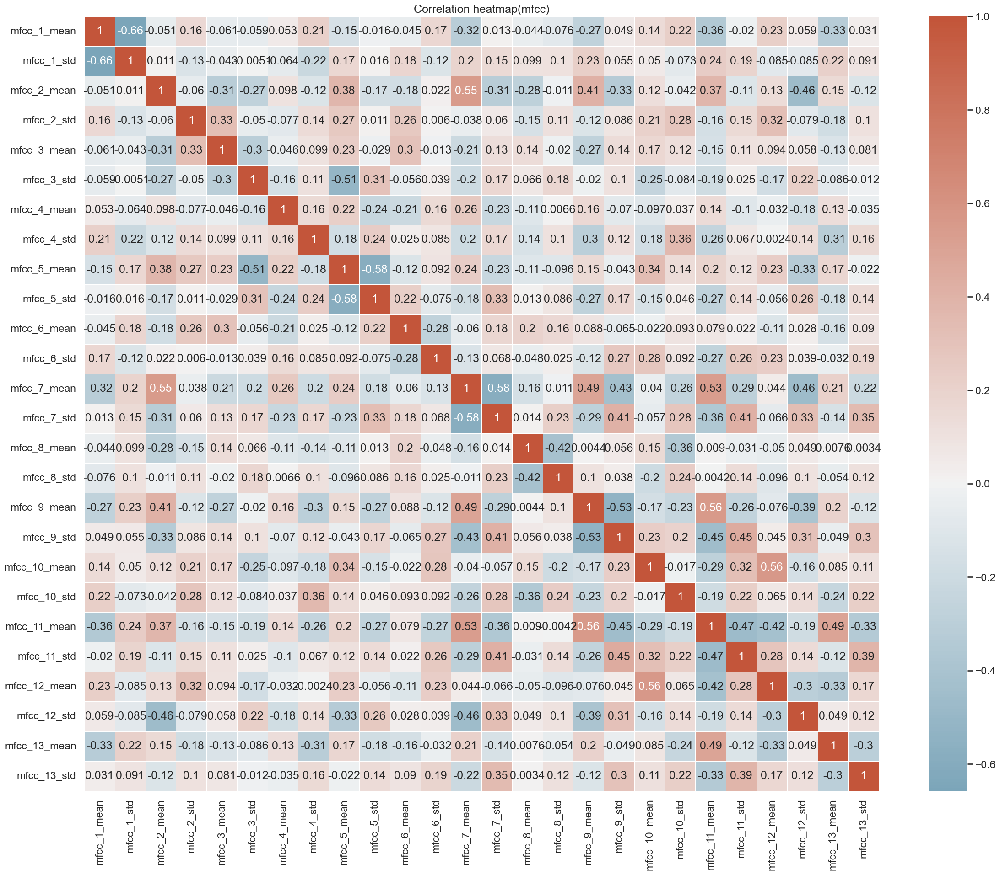

In [27]:
mfcc_corr = voice_df[mfcc_cols].corr()
fig,ax = plt.subplots(figsize=(28,22))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mfcc_corr,cmap=cmap,linewidths=0.5,linecolor='white',center=0,annot=True)
plt.title('Correlation heatmap(mfcc)')

In [28]:
# mfcc_df = remove_highcorr(voice_df,mfcc_corr)

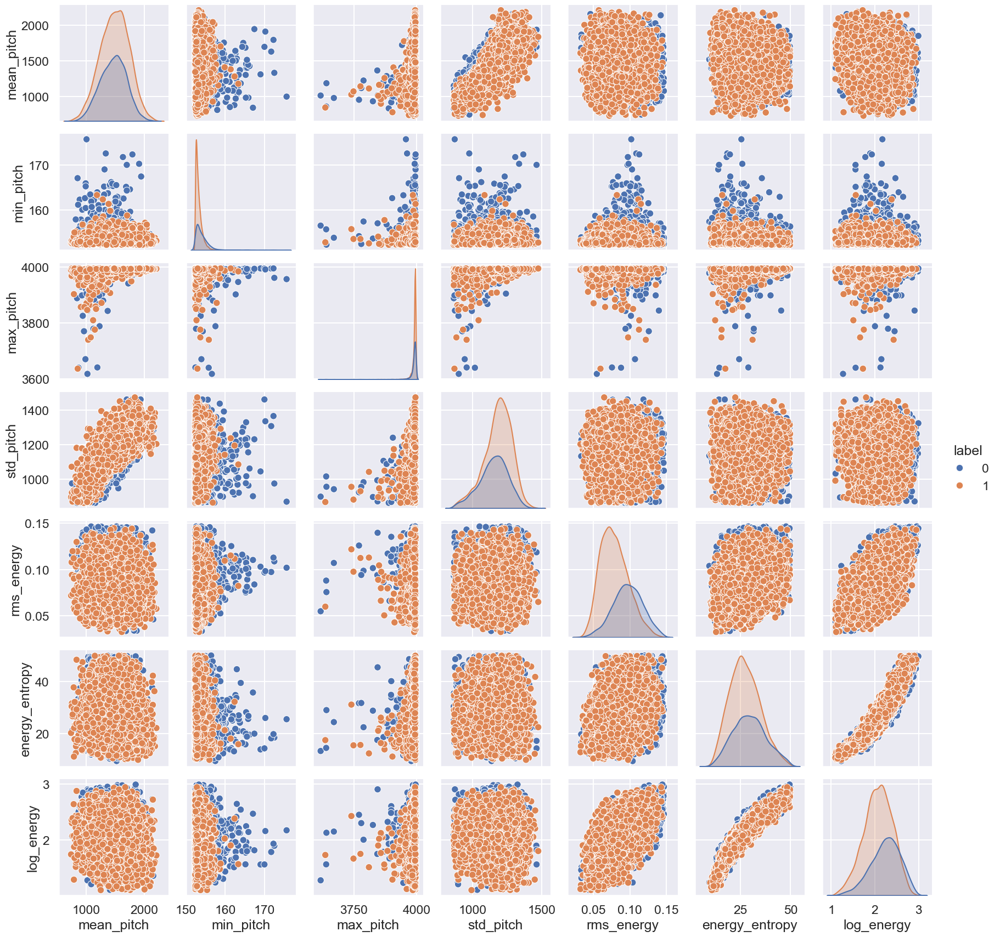

In [29]:
sns.pairplot(voice_df,vars=pitch_cols+energy_cols,hue='label')
plt.show()

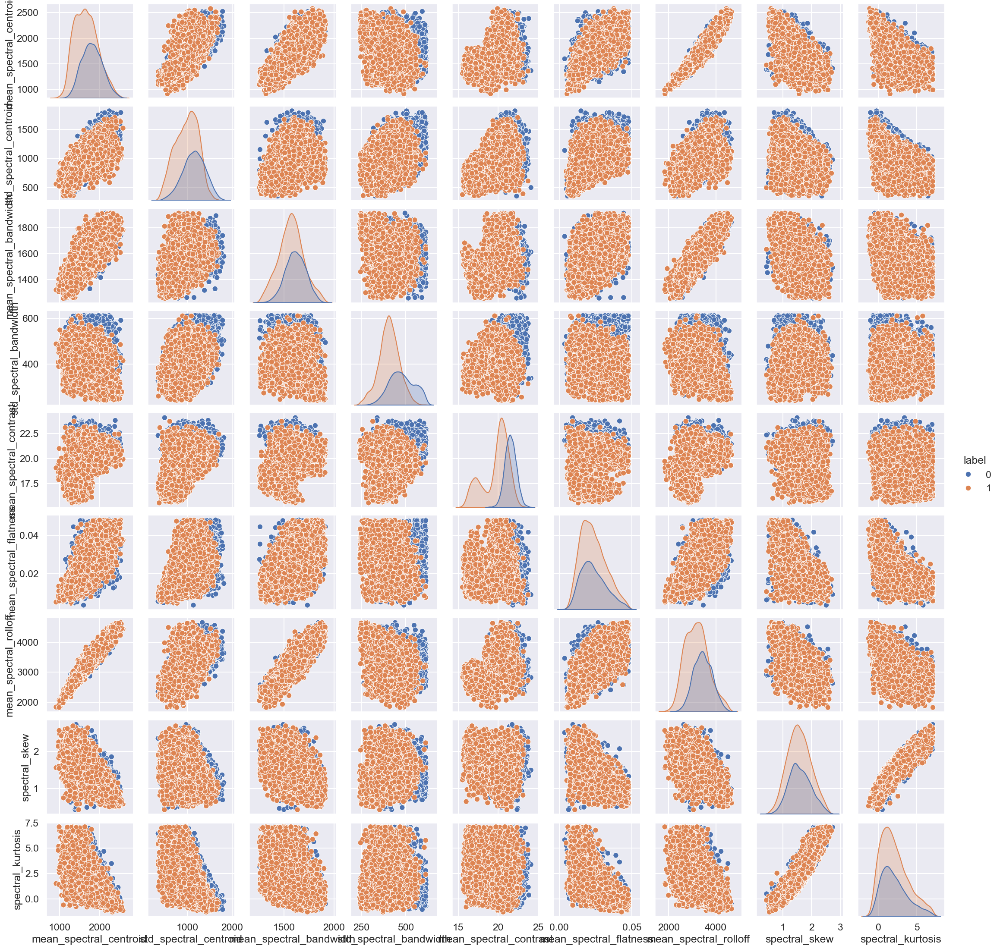

In [30]:
sns.pairplot(voice_df,vars=spectral_cols,hue='label')
plt.show()

In [31]:
len(voice_df)

10189

In [32]:
pitch_df = voice_df.loc[:,pitch_cols]

In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [34]:
pitch_scaler = StandardScaler()

In [35]:
pitch_df_scaled = pitch_scaler.fit_transform(pitch_df)

<Axes: xlabel='Pc1', ylabel='Pc2'>

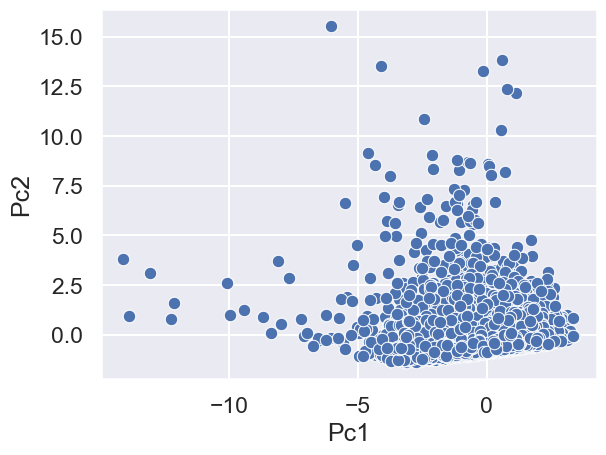

In [36]:
pca =PCA(n_components=2)
pcomp = pca.fit_transform(pitch_df_scaled)
plot_df_std = pd.DataFrame(pcomp,columns=['Pc1','Pc2'])
sns.scatterplot(plot_df_std,x='Pc1',y='Pc2')

In [37]:
from sklearn.cluster import KMeans,DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import pickle as pkl


In [38]:
cols = voice_df.columns.to_list()
cols.remove('label')
x = voice_df[cols]

In [39]:
kmeans_pitch = KMeans(n_clusters=5,random_state=2)
pitch_pipe = Pipeline(steps=[('select',ColumnTransformer([('features','passthrough',pitch_cols)],remainder='drop')),('pitch_cluster',kmeans_pitch)])
lables = pitch_pipe.fit_predict(x)
print('silhouette_score:',silhouette_score(pitch_df,lables).round(4))

silhouette_score: 0.3823


In [40]:
# kmeans = KMeans(n_clusters=5,random_state=2)
# lables_s = kmeans.fit_predict(pitch_df_scaled)
# print('silhouette_score:',silhouette_score(pitch_df_scaled,lables_s).round(4))

In [41]:
pitch_df['cluster1'] = lables
print(pitch_df.groupby('cluster1').mean())

           mean_pitch   min_pitch    max_pitch    std_pitch
cluster1                                                   
0         1465.383092  153.518851  3991.339754  1181.305314
1         1065.818755  153.643698  3979.010766   992.889272
2         1856.069400  153.350608  3993.512705  1276.670541
3         1643.301159  153.426860  3992.757886  1233.711892
4         1280.033637  153.492081  3987.997654  1114.020186


In [42]:
pitch_df.value_counts('cluster1')

cluster1
0    2839
3    2665
4    2293
2    1280
1    1112
Name: count, dtype: int64

In [43]:
# dbs = DBSCAN(eps=0.8)
# lables = dbs.fit_predict(pitch_df_scaled)
# print('silhouette_score:',silhouette_score(pitch_df_scaled,lables).round(4))
# x = dbs.labels_
# n_clusters = len(set(x))-(1 if -1 in x else 0)
# n_noise = list(x).count(-1)
# print(f'no of clusters:{n_clusters}')
# print(f'noise:{n_noise}')

In [44]:
clustered_df = voice_df.copy()

In [45]:
clustered_df['pitch_cluster'] = pitch_df['cluster1']

In [46]:
# pitch_df['cluster'] = lables
# print(pitch_df.groupby('cluster').mean())

In [47]:
# pitch_df.value_counts('cluster')

In [48]:
# pitch_df['cluster1'] = lables1
# print(pitch_df.groupby('cluster1').mean())

In [49]:
spectral_df = voice_df.loc[:,spectral_cols]

In [50]:
spec_scaler = StandardScaler()

In [51]:
spec_df_scaled = spec_scaler.fit_transform(spectral_df)

<Axes: xlabel='Pc1', ylabel='Pc2'>

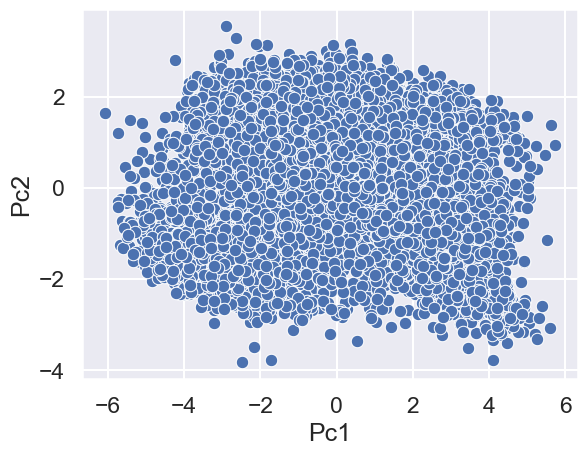

In [52]:
pca =PCA(n_components=2)
pcomp = pca.fit_transform(spec_df_scaled)
plot_df_std = pd.DataFrame(pcomp,columns=['Pc1','Pc2'])
sns.scatterplot(plot_df_std,x='Pc1',y='Pc2')

In [53]:
# clusters = []
# score = []
# for i in range(2,31):
#     kmeans = KMeans(n_clusters=i,random_state=2)
#     spec_lab1 = kmeans.fit_predict(spec_df_scaled)
#     clusters.append(i)
#     score.append(silhouette_score(spec_df_scaled,spec_lab1).round(4))
# plt.plot(clusters,score)
# plt.xlabel('n_clusters')
# plt.ylabel('score')
# plt.show()

In [54]:
# kmeans = KMeans(n_clusters=3,random_state=2)
# spec_lab1 = kmeans.fit_predict(spec_df_scaled)
# print('silhouette_score:',silhouette_score(spec_df_scaled,spec_lab1).round(4))

In [55]:
# spectral_df['cluster'] = spec_lab1
# print(spectral_df.groupby('cluster').mean())

In [56]:
# spectral_df.value_counts('cluster')

In [57]:
# clusters = []
# score = []
# for i in range(2,31):
#     kmeans = KMeans(n_clusters=i,random_state=2)
#     spec_lab1 = kmeans.fit_predict(spectral_df)
#     clusters.append(i)
#     score.append(silhouette_score(spectral_df,spec_lab1).round(4))
# plt.plot(clusters,score)
# plt.xlabel('n_clusters')
# plt.ylabel('score')
# plt.show()

In [58]:
kmeans_spec = KMeans(n_clusters=3,random_state=2)
spectral_pipe = Pipeline(steps=[('select',ColumnTransformer([('features','passthrough',spectral_cols)],remainder='drop')),('spectral_cluster',kmeans_spec)])
spec_lab1 = spectral_pipe.fit_predict(x)
print('silhouette_score:',silhouette_score(spectral_df,spec_lab1).round(4))

silhouette_score: 0.4044


In [59]:
spectral_df['cluster'] = spec_lab1
print(spectral_df.groupby('cluster').mean())

         mean_spectral_centroid  std_spectral_centroid  \
cluster                                                  
0                   1370.919834             760.836950   
1                   2063.558394            1227.159609   
2                   1705.014493            1105.398133   

         mean_spectral_bandwidth  std_spectral_bandwidth  \
cluster                                                    
0                    1464.865283              412.072210   
1                    1703.700922              419.912408   
2                    1590.607009              445.999752   

         mean_spectral_contrast  mean_spectral_flatness  \
cluster                                                   
0                     19.000416                0.017373   
1                     20.910417                0.029691   
2                     20.875180                0.023474   

         mean_spectral_rolloff  spectral_skew  spectral_kurtosis  
cluster                                      

In [60]:
spectral_df.value_counts('cluster')

cluster
2    4527
0    2873
1    2789
Name: count, dtype: int64

In [61]:
clustered_df['Spectral_cluster'] = spectral_df['cluster']

In [62]:
# i = 0.5
# while i<2.2:
#     dbs = DBSCAN(eps=i)
#     lables = dbs.fit_predict(spec_df_scaled)
#     x = dbs.labels_
#     n_clusters = len(set(x))-(1 if -1 in x else 0)
#     n_noise = list(x).count(-1)
#     print(f'eps:{i}',f'no of clusters:{n_clusters}','silhouette_score:',silhouette_score(spec_df_scaled,lables).round(4),f'noise:{n_noise}')
#     i+=0.1

In [63]:
mfcc_df = voice_df.loc[:,mfcc_cols]

<Axes: xlabel='Pc1', ylabel='Pc2'>

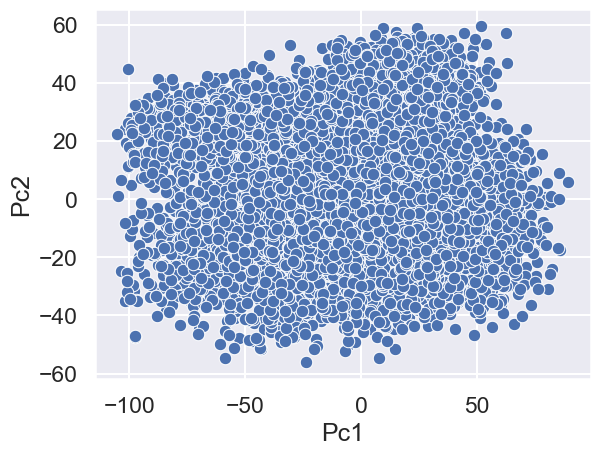

In [64]:
pca =PCA(n_components=2)
pcomp = pca.fit_transform(mfcc_df)
plot_df_std = pd.DataFrame(pcomp,columns=['Pc1','Pc2'])
sns.scatterplot(plot_df_std,x='Pc1',y='Pc2')

In [65]:
mfcc_scaler = StandardScaler()

In [66]:
mfcc_df_scaled = mfcc_scaler.fit_transform(mfcc_df)

<Axes: xlabel='Pc1', ylabel='Pc2'>

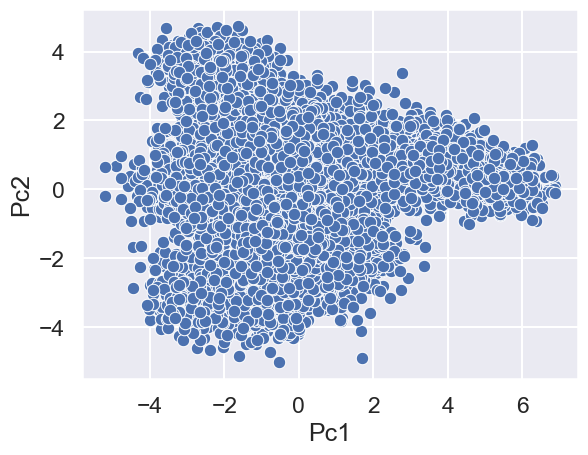

In [67]:
pca =PCA(n_components=2)
pcomp = pca.fit_transform(mfcc_df_scaled)
plot_df_std = pd.DataFrame(pcomp,columns=['Pc1','Pc2'])
sns.scatterplot(plot_df_std,x='Pc1',y='Pc2')

In [68]:
# clusters = []
# score = []
# for i in range(2,51):
#     kmeans = KMeans(n_clusters=i,random_state=2)
#     mfcc_lab1 = kmeans.fit_predict(mfcc_df)
#     clusters.append(i)
#     score.append(silhouette_score(mfcc_df,mfcc_lab1).round(4))
# plt.plot(clusters,score)
# plt.xlabel('n_clusters')
# plt.ylabel('score')
# plt.show()

In [69]:
kmeans_mfcc = KMeans(n_clusters=2,random_state=2)
mfcc_pipe = Pipeline(steps=[('select',ColumnTransformer([('features','passthrough',mfcc_cols)],remainder='drop')),('mfcc_cluster',kmeans_mfcc)])
mfcc_lab1 = mfcc_pipe.fit_predict(x)
print(f'Silhoutte_score:{silhouette_score(mfcc_df,mfcc_lab1).round(4)}')

Silhoutte_score:0.2692


In [70]:
mfcc_df['cluster'] = mfcc_lab1
print(mfcc_df.groupby('cluster').mean())

         mfcc_1_mean  mfcc_1_std  mfcc_2_mean  mfcc_2_std  mfcc_3_mean  \
cluster                                                                  
0        -285.101148  132.927081    85.749461   53.782548     4.954185   
1        -232.434370  107.744442    85.762271   56.523809     3.557119   

         mfcc_3_std  mfcc_4_mean  mfcc_4_std  mfcc_5_mean  mfcc_5_std  ...  \
cluster                                                                ...   
0         35.184545    33.285668   28.516916    -3.918058   22.606276  ...   
1         34.415946    33.968154   30.232234    -6.570175   22.450832  ...   

         mfcc_9_mean  mfcc_9_std  mfcc_10_mean  mfcc_10_std  mfcc_11_mean  \
cluster                                                                     
0          -6.671139   13.581896     -0.884078    11.960667     -6.801317   
1          -9.344305   13.517772      0.038816    12.640318     -9.664620   

         mfcc_11_std  mfcc_12_mean  mfcc_12_std  mfcc_13_mean  mfcc_13_std  
clus

In [71]:
std_cols = [x for x in list(mfcc_df.columns) if 'std' in x ]

In [72]:
mfcc_df_mean = mfcc_df.drop(columns=std_cols,axis=1)
mfcc_df_std = mfcc_df.loc[:,std_cols+['cluster']]

In [73]:
print(mfcc_df_mean.groupby('cluster').mean())

         mfcc_1_mean  mfcc_2_mean  mfcc_3_mean  mfcc_4_mean  mfcc_5_mean  \
cluster                                                                    
0        -285.101148    85.749461     4.954185    33.285668    -3.918058   
1        -232.434370    85.762271     3.557119    33.968154    -6.570175   

         mfcc_6_mean  mfcc_7_mean  mfcc_8_mean  mfcc_9_mean  mfcc_10_mean  \
cluster                                                                     
0           3.406504    -6.299713    -4.795242    -6.671139     -0.884078   
1           2.393664   -10.393839    -5.428865    -9.344305      0.038816   

         mfcc_11_mean  mfcc_12_mean  mfcc_13_mean  
cluster                                            
0           -6.801317     -0.552955     -4.920474  
1           -9.664620      1.246906     -7.054426  


In [74]:
print(mfcc_df_std.groupby('cluster').mean())

         mfcc_1_std  mfcc_2_std  mfcc_3_std  mfcc_4_std  mfcc_5_std  \
cluster                                                               
0        132.927081   53.782548   35.184545   28.516916   22.606276   
1        107.744442   56.523809   34.415946   30.232234   22.450832   

         mfcc_6_std  mfcc_7_std  mfcc_8_std  mfcc_9_std  mfcc_10_std  \
cluster                                                                
0         16.736826   16.317822   15.116152   13.581896    11.960667   
1         17.408435   16.068417   14.718060   13.517772    12.640318   

         mfcc_11_std  mfcc_12_std  mfcc_13_std  
cluster                                         
0          11.069814     9.662534     9.425903  
1          10.842365     9.792225     9.440999  


In [75]:
# clusters = []
# score = []
# for i in range(2,101):
#     kmeans = KMeans(n_clusters=i,random_state=2)
#     mfcc_lab2 = kmeans.fit_predict(mfcc_df_scaled)
#     clusters.append(i)
#     score.append(silhouette_score(mfcc_df_scaled,mfcc_lab2).round(4))
# plt.plot(clusters,score)
# plt.xlabel('n_clusters')
# plt.ylabel('score')
# plt.show()

In [76]:
# i = 0.1
# while i<5:
#     try:
#         dbs = DBSCAN(eps=i)
#         lables = dbs.fit_predict(mfcc_df_scaled)
#         x = dbs.labels_
#         n_clusters = len(set(x))-(1 if -1 in x else 0)
#         n_noise = list(x).count(-1)
#         print(f'eps:{i}',f'no of clusters:{n_clusters}','silhouette_score:',silhouette_score(mfcc_df_scaled,lables).round(4),f'noise:{n_noise}')
#         i+=0.1
#     except ValueError:
#         print(f'eps:{i} ERROR')
#         i+=0.1

In [77]:
# from sklearn.cluster import AgglomerativeClustering
# ha= AgglomerativeClustering(n_clusters=10)
# lables = ha.fit_predict(mfcc_df_scaled)
# print(f'Silhoutte_score:{silhouette_score(mfcc_df_scaled,lables).round(4)}')

In [78]:
# for i in range(2,51):
#     ha= AgglomerativeClustering(n_clusters=10)
#     lables = ha.fit_predict(mfcc_df_scaled)
#     print(f'n_clusters:{i} Silhoutte_score:{silhouette_score(mfcc_df_scaled,lables).round(4)}')

In [79]:
# from scipy.cluster.hierarchy import dendrogram,linkage

In [80]:
# Z = linkage(mfcc_df_scaled,'ward')
# dendrogram(Z)

In [81]:
clustered_df['mfcc_cluster'] = mfcc_df['cluster']

In [82]:
clustered_df.head()

,mean_spectral_centroid,std_spectral_centroid,mean_spectral_bandwidth,std_spectral_bandwidth,mean_spectral_contrast,mean_spectral_flatness,mean_spectral_rolloff,zero_crossing_rate,rms_energy,mean_pitch,...,mfcc_11_mean,mfcc_11_std,mfcc_12_mean,mfcc_12_std,mfcc_13_mean,mfcc_13_std,label,pitch_cluster,Spectral_cluster,mfcc_cluster
1,1790.719889,996.554825,1757.898617,410.710318,21.513383,0.018936,3635.742188,0.108068,0.055477,1112.6351,...,-0.088775,10.297690,-7.281142,10.926579,-0.450248,8.489134,0,1,2,1
2,1977.923363,1010.148667,1747.099555,461.458379,20.476283,0.032616,3873.291016,0.144633,0.060388,1557.5225,...,-0.420670,10.810292,-0.199829,11.986182,3.372986,9.285437,0,0,1,0
4,1739.383829,1092.623322,1623.135563,450.088465,20.260620,0.025737,3452.903892,0.117961,0.069078,1424.5352,...,-6.561539,11.944948,1.410639,13.110976,-3.252258,9.866687,0,0,2,0
5,2012.022171,1248.922879,1725.005365,459.774696,21.442285,0.022706,3853.348214,0.160184,0.096510,1366.1226,...,-16.016607,11.290726,6.695247,9.033471,-10.493073,9.583606,0,4,1,1
6,1954.662813,1423.398844,1635.912770,536.897718,22.254619,0.038629,3598.531789,0.155307,0.106471,1613.4988,...,-9.244686,9.068125,-2.237413,9.636229,-6.018993,6.691441,0,3,1,1


In [83]:
energy_df = voice_df.loc[:,energy_cols]

In [84]:
energy_scaler = StandardScaler()

In [85]:
energy_df_scaled = energy_scaler.fit_transform(energy_df)

In [86]:
# clusters = []
# score = []
# for i in range(2,21):
#     kmeans = KMeans(n_clusters=i,random_state=2)
#     energy_lab1 = kmeans.fit_predict(energy_df)
#     clusters.append(i)
#     score.append(silhouette_score(energy_df,energy_lab1).round(4))
# plt.plot(clusters,score)
# plt.xlabel('n_clusters')
# plt.ylabel('score')
# plt.show()

In [87]:
kmeans_energy = KMeans(n_clusters=4,random_state=2)
energy_pipe = Pipeline(steps=[('select',ColumnTransformer([('features','passthrough',energy_cols)],remainder='drop')),('energy_cluster',kmeans_energy)])
energy_lab = energy_pipe.fit_predict(x)
print(silhouette_score(energy_df,energy_lab).round(4))

0.5363


In [88]:
# clusters = []
# score = []
# for i in range(2,21):
#     kmeans = KMeans(n_clusters=i,random_state=2)
#     energy_lab2 = kmeans.fit_predict(energy_df_scaled)
#     clusters.append(i)
#     score.append(silhouette_score(energy_df_scaled,energy_lab2).round(4))
# plt.plot(clusters,score)
# plt.xlabel('n_clusters')
# plt.ylabel('score')
# plt.show()

In [89]:
energy_df['cluster'] = energy_lab
energy_df.groupby('cluster').mean()

,rms_energy,energy_entropy,log_energy
cluster,,,
0,0.081506,25.772556,2.061437
1,0.100063,41.522433,2.618829
2,0.075808,18.318650,1.689514
3,0.089746,32.866067,2.341542


In [90]:
# def energygroup(x):
#     if x == 1:
#         'High entropy'
#     elif x==2:
#         'Moderate entropy'
#     elif x==0:
#         'low entropy'
#     elif x==3:
#         'very low entropy'
# energy_df['group'] = energy_df['cluster'].apply(energygroup)

In [91]:
clustered_df['energy_cluster'] = energy_df['cluster']
clustered_df.head()

,mean_spectral_centroid,std_spectral_centroid,mean_spectral_bandwidth,std_spectral_bandwidth,mean_spectral_contrast,mean_spectral_flatness,mean_spectral_rolloff,zero_crossing_rate,rms_energy,mean_pitch,...,mfcc_11_std,mfcc_12_mean,mfcc_12_std,mfcc_13_mean,mfcc_13_std,label,pitch_cluster,Spectral_cluster,mfcc_cluster,energy_cluster
1,1790.719889,996.554825,1757.898617,410.710318,21.513383,0.018936,3635.742188,0.108068,0.055477,1112.6351,...,10.297690,-7.281142,10.926579,-0.450248,8.489134,0,1,2,1,2
2,1977.923363,1010.148667,1747.099555,461.458379,20.476283,0.032616,3873.291016,0.144633,0.060388,1557.5225,...,10.810292,-0.199829,11.986182,3.372986,9.285437,0,0,1,0,2
4,1739.383829,1092.623322,1623.135563,450.088465,20.260620,0.025737,3452.903892,0.117961,0.069078,1424.5352,...,11.944948,1.410639,13.110976,-3.252258,9.866687,0,0,2,0,0
5,2012.022171,1248.922879,1725.005365,459.774696,21.442285,0.022706,3853.348214,0.160184,0.096510,1366.1226,...,11.290726,6.695247,9.033471,-10.493073,9.583606,0,4,1,1,3
6,1954.662813,1423.398844,1635.912770,536.897718,22.254619,0.038629,3598.531789,0.155307,0.106471,1613.4988,...,9.068125,-2.237413,9.636229,-6.018993,6.691441,0,3,1,1,3


In [92]:
pitch_cols1 = []
spectral_cols1=[]
energy_cols1=[]
mfcc_cols1 = []
other_cols1 = []
for col in list(voice_df.columns):
    if 'pitch' in col:
        pitch_cols1.append(col)
    elif 'spectral' in col:
        spectral_cols1.append(col)
    elif 'energy' in col:
        energy_cols1.append(col)
    elif 'mfcc' in col:
        mfcc_cols1.append(col)
    else:
        other_cols1.append(col)

In [93]:
clustered_df = clustered_df.drop(pitch_cols1+spectral_cols1+energy_cols1+mfcc_cols1,axis=1)
clustered_df.head()

,zero_crossing_rate,label,pitch_cluster,Spectral_cluster,mfcc_cluster,energy_cluster
1,0.108068,0,1,2,1,2
2,0.144633,0,0,1,0,2
4,0.117961,0,0,2,0,0
5,0.160184,0,4,1,1,3
6,0.155307,0,3,1,1,3


<Axes: xlabel='label', ylabel='count'>

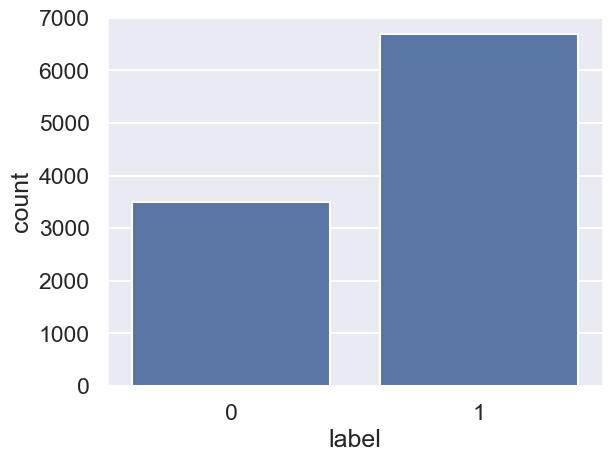

In [94]:
sns.countplot(clustered_df,x = 'label')

Text(0.5, 1.0, 'Correlation heatmap after clustering')

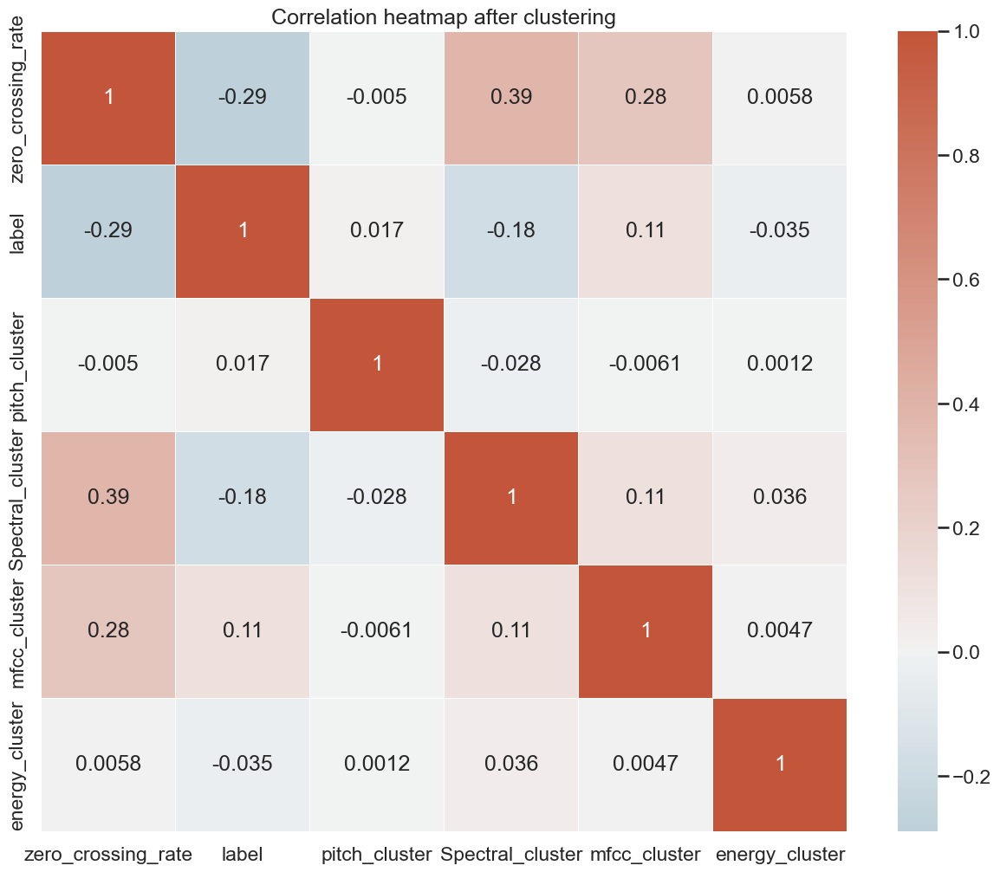

In [95]:
clustered_corr = clustered_df.corr()
fig,ax = plt.subplots(figsize=(15,12))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(clustered_corr,cmap=cmap,linewidths=0.5,linecolor='white',center=0,annot=True)
plt.title('Correlation heatmap after clustering')

In [96]:
x_cols = list(clustered_df.columns)
x_cols.remove('label')
y_col = ['label']

In [128]:
X = clustered_df[x_cols]
Y = clustered_df[y_col]

In [155]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

In [130]:
# smote=SMOTE(random_state=2)
# X,Y_res = smote.fit_resample(X,Y)

In [156]:
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.2)

In [157]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [158]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

In [159]:
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
y_pred = rfc.predict(x_test)
print(classification_report(y_test,y_pred))

c:\Users\Udith\anaconda3\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


              precision    recall  f1-score   support

           0       0.52      0.51      0.51       704
           1       0.74      0.75      0.74      1334

    accuracy                           0.66      2038
   macro avg       0.63      0.63      0.63      2038
weighted avg       0.66      0.66      0.66      2038



In [160]:
from sklearn.svm import SVC

In [161]:
svc = SVC(C=0.9,kernel='rbf')
svc.fit(x_train,y_train)
y_pred = svc.predict(x_test)
print(classification_report(y_test,y_pred))

c:\Users\Udith\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

           0       0.65      0.34      0.45       704
           1       0.72      0.90      0.80      1334

    accuracy                           0.71      2038
   macro avg       0.69      0.62      0.62      2038
weighted avg       0.70      0.71      0.68      2038



In [162]:
from sklearn.svm import LinearSVC

In [163]:
svc_lin = LinearSVC()
svc_lin.fit(x_train,y_train)
y_pred = svc_lin.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.63      0.33      0.43       704
           1       0.72      0.90      0.80      1334

    accuracy                           0.70      2038
   macro avg       0.67      0.61      0.61      2038
weighted avg       0.69      0.70      0.67      2038



c:\Users\Udith\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [164]:
import torch
from torch import nn
from torch.utils.data import TensorDataset,DataLoader
from torch import optim
from torchmetrics import Precision,Recall,Accuracy,F1Score

In [165]:
y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

In [166]:
# x_train = x_train.to_numpy()
# x_test = x_test.to_numpy()

In [167]:
train_dataset = TensorDataset(torch.tensor(x_train).float(),torch.tensor(y_train).float())
train_loader = DataLoader(train_dataset,batch_size=32,shuffle=True)

In [168]:
test_dataset = TensorDataset(torch.tensor(x_test).float(),torch.tensor(y_test).float())
test_loader = DataLoader(test_dataset,batch_size=16,shuffle=True)

In [169]:
f,l = next(iter(train_loader))
f.shape

torch.Size([32, 5])

In [170]:
class fblock(nn.Module):
    def __init__(self,ip, op):
        super().__init__()
        self.f1 = nn.Sequential(nn.Linear(ip,64),nn.ELU())
        self.f2 = nn.Sequential(nn.Linear(64,128),nn.ELU())
        self.f3 = nn.Sequential(nn.Linear(128,256),nn.ELU())
        self.f4 = nn.Sequential(nn.Linear(256,512),nn.ELU())
        self.f5 = nn.Sequential(nn.Linear(512,op),nn.ELU(),nn.Dropout(0.1))
    def forward(self,x):
        x = self.f1(x)
        x = self.f2(x)
        x = self.f3(x)
        x = self.f4(x)
        x = self.f5(x)
        return x
class binaryNet(nn.Module):
    def __init__(self,ip):
        super().__init__()
        self.f1 = fblock(ip,512)
        self.f2 = fblock(512,1024)
        self.f3 = nn.Sequential(nn.Linear(1024,1),nn.Sigmoid())
    def forward(self,x):
        x = self.f1(x)
        x = self.f2(x)
        x = self.f3(x)
        return x
        

In [171]:
model = binaryNet(5)
critireon = nn.BCELoss()
optimizer = optim.Adam(model.parameters(),lr=0.001)

In [172]:
best_val_acc = float(0)
patience = 10
trigger_times = 0
train_acc = []
test_acc = []

In [173]:
for epoch in range(500):
    met_acc = Accuracy(task='binary')
    model.train()
    for features,label in train_loader:
        optimizer.zero_grad()
        outputs = model(features)
        loss = critireon(outputs,label)
        met_acc(outputs,label)
        loss.backward()
        optimizer.step()
    epoch_acc = met_acc.compute()
    train_acc.append(epoch_acc)
    model.eval()
    with torch.no_grad():
        for features,label in test_loader:
            output = model(features)
            met_acc(output,label)
    accuracy = met_acc.compute()
    test_acc.append(accuracy)
    if accuracy>=best_val_acc:
        best_val_acc = accuracy
        trigger_times = 0
    else:
        trigger_times += 1
        if trigger_times >=patience:
            print('Early Stopping')
            break

Early Stopping


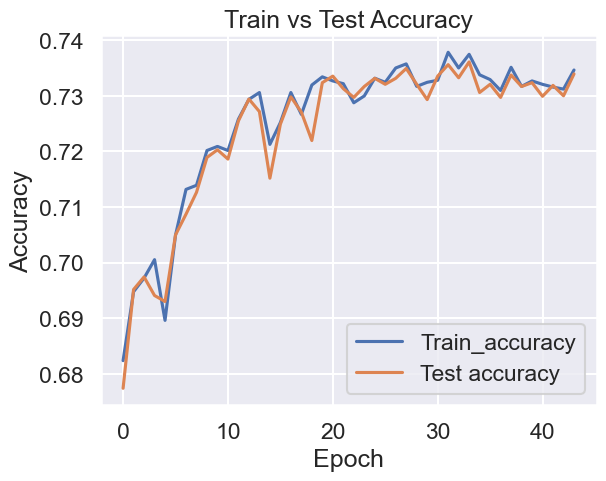

In [174]:
plt.plot(train_acc,label='Train_accuracy')
plt.plot(test_acc,label = 'Test accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train vs Test Accuracy')
plt.legend()

In [175]:
met_prec = Precision(task='binary',average='macro')
met_rec = Recall(task='binary',average='macro')
met_acc = Accuracy(task='binary')
met_f1 = F1Score(task='binary')
model.eval()
with torch.no_grad():
    for features,label in test_loader:
        output = model(features)
        met_prec(output,label)
        met_rec(output,label)
        met_acc(output,label)
        met_f1(output,label)
precision = met_prec.compute()
recall = met_rec.compute()
accuracy = met_acc.compute()
F1_score = met_f1.compute()
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'Accuracy: {accuracy}')
print(f'F1 Score: {F1_score}')

Precision: 0.7868613004684448
Recall: 0.8080959320068359
Accuracy: 0.7311089038848877
F1 Score: 0.7973372936248779


In [176]:
pkl.dump(pitch_pipe,open('pitch_cluster.sav','wb'))
pkl.dump(spectral_pipe,open('spectral_cluster.sav','wb'))
pkl.dump(mfcc_pipe,open('mfcc_cluster.sav','wb'))
pkl.dump(energy_pipe,open('energy_cluster.sav','wb'))
torch.save(model.state_dict(),'Voice_predictor_dict.sav')
pkl.dump(scaler,open('scaler.sav','wb'))